# Knot points reconstruction, hyperparameter optimization using optuna, 10-fold CV


In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.linear_model import MultiTaskElasticNetCV
from sklearn.decomposition import PCA
from sklearn.metrics import root_mean_squared_error,mean_absolute_error

from scipy.interpolate import pchip_interpolate
from scipy.optimize import curve_fit

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader,TensorDataset,random_split

import optuna
import random

import pickle

In [18]:
seed_ = 42
random.seed(seed_)
torch.manual_seed(seed_)
np.random.seed(seed_)
torch.use_deterministic_algorithms(True)

## Load data

Import interpolated data

In [ ]:
training_cells = pd.read_csv("../Data_preprocessing/training.csv",header=None).to_numpy(dtype=str).reshape(-1,).tolist()
test_in_cells = pd.read_csv("../Data_preprocessing/test_in.csv",header=None).to_numpy(dtype=str).reshape(-1,).tolist()
test_out_cells = pd.read_csv("../Data_preprocessing/test_out.csv",header=None).to_numpy(dtype=str).reshape(-1,).tolist()

num_training_cells = len(training_cells)
num_test_in_cells = len(test_in_cells)
num_test_out_cells = len(test_out_cells)

In [ ]:
X_train_PCA = np.loadtxt("Processed_input_output/X_train_PCA.csv",delimiter=",")
X_test_in_PCA = np.loadtxt("Processed_input_output/X_test_in_PCA.csv",delimiter=",")
X_test_out_PCA = np.loadtxt("Processed_input_output/X_test_out_PCA.csv",delimiter=",")

N_train = np.loadtxt("Processed_input_output/N_train.csv",delimiter=",")
N_test_in = np.loadtxt("Processed_input_output/N_test_in.csv",delimiter=",")
N_test_out = np.loadtxt("Processed_input_output/N_test_out.csv",delimiter=",")

Y_train = np.loadtxt("Processed_input_output/knot_train.csv",delimiter=",")
Y_scaler = MinMaxScaler()
Y_train_scaled = Y_scaler.fit_transform(Y_train)

Q_train = np.array([np.linspace(1,0.8,21)]*num_training_cells)
Q_test_in = np.array([np.linspace(1,0.8,21)]*num_test_in_cells)
Q_test_out = np.array([np.linspace(1,0.8,21)]*num_test_out_cells)

In [23]:
with open('training_cells_CV.pkl','rb') as f:
    training_cells_CV = pickle.load(f)

with open('val_cells_CV.pkl','rb') as f:
    val_cells_CV = pickle.load(f)

train_dataset_CV = []
val_dataset_CV = []
for fold in range(10):
    train_cells = training_cells_CV[fold]
    val_cells = val_cells_CV[fold]

    X_train_fold = X_train_PCA[train_cells]
    X_val_fold = X_train_PCA[val_cells]
   
    Y_train_fold = Y_train_scaled[train_cells]
    Y_val_fold = Y_train_scaled[val_cells]
    # print(Y_val_fold)

    X_train_fold = torch.tensor(X_train_fold,dtype=torch.float32)
    X_val_fold = torch.tensor(X_val_fold,dtype=torch.float32)

    Y_train_fold = torch.tensor(Y_train_fold,dtype=torch.float32)
    Y_val_fold = torch.tensor(Y_val_fold,dtype=torch.float32)


    train_dataset = TensorDataset(X_train_fold,Y_train_fold)
    val_dataset = TensorDataset(X_val_fold,Y_val_fold)

    train_dataset_CV.append(train_dataset)
    val_dataset_CV.append(val_dataset)


# Build neural network for this task

In [24]:
# Define the network
class network(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size):
        super(network, self).__init__()
        # Define the layers
        self.layers = nn.ModuleList()
        self.layers.append(nn.Linear(input_size, hidden_sizes[0]))  # Input layer
        for i in range(1, len(hidden_sizes)):
            self.layers.append(nn.Linear(hidden_sizes[i-1], hidden_sizes[i]))  # Hidden layers
        self.layers.append(nn.Linear(hidden_sizes[-1], output_size))  # Output layer
        
    def forward(self, x):
        for layer in self.layers[:-1]:
            x = torch.relu(layer(x))
        x = torch.relu(self.layers[-1](x))

        return x
    
# Define the early stopping class
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

# Define the input size and output size
input_size = 10 # 10 pca features
output_size = 5 # 5 intervals or 5 locations

Hyperparameter optimization via optuna

In [ ]:
best_model_path = 'Best_network/best_knot_model_V2.pth'  # File to save the best model
best_val_loss = float('inf')

# Hyperparameters to optimize: lr, # of neurons, # of layers
def objective(trial):
    global best_val_loss

    val_loss_CV = []
    model_state_dict = {}
    # Hyperparameter search space
    # lr = trial.suggest_float('lr', 5e-4, 5e-2,log=True)
    lr = trial.suggest_float('lr', 1e-4, 1e-1,log=True)
    num_neuron = trial.suggest_int('num_neuron',5,20)
    num_layer = trial.suggest_int('num_layer',2,5)
    hidden_sizes = [num_neuron]*num_layer # Mapping 

    batch_size = trial.suggest_int('batch_size', 16, 45)
    weight_decay = trial.suggest_float('weight_decay', 1e-8, 1e-6,log=True)

    # Define the starting epoch of checking early stopping and maximum number of epochs
    warmup_epochs = 150 
    num_epochs = 1000

    for fold in range(10):
        # Load dataset for the current fold
        train_dataset = train_dataset_CV[fold]
        val_dataset = val_dataset_CV[fold]
        train_loader = DataLoader(train_dataset,batch_size=batch_size,shuffle=True)
        val_loader = DataLoader(val_dataset,batch_size=16,shuffle=False)
        
        # Initialize model, loss function, optimizer, and early stopping        
        model = network(input_size,hidden_sizes,output_size)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(),lr = lr,weight_decay=weight_decay)
        early_stopping = EarlyStopping(patience=25, min_delta=1e-5)

        # Training loop
        for epoch in range(num_epochs):
            # Training phase
            model.train()
            for batch in train_loader:
                inputs, labels = batch
                
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
            
            # Validation phase
            model.eval()
            val_loss = 0.0
            with torch.no_grad():
                for inputs, targets in val_loader:
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                    val_loss += loss.item()
            val_loss /= len(val_loader)

            # Check early stopping condition
            if epoch > warmup_epochs:
                early_stopping(val_loss)
                if early_stopping.early_stop:
                    print(f"Early stopping at epoch {epoch+1}")
                    break
                
        val_loss_CV.append(val_loss)
        model_state_dict[fold] = model.state_dict()

    val_loss_overall = np.mean(val_loss_CV)
    print(f"Validation loss: {val_loss_CV}")
    # Check if the current validation loss is the best
    if val_loss_overall < best_val_loss:
        best_val_loss = val_loss_overall
        # Save the best model
        torch.save({'model_state':model_state_dict,
                    'lr':lr,
                    'num_neuron':num_neuron,
                    'num_layer':num_layer,
                    'batch_size':batch_size,
                    'weight_decay':weight_decay}, best_model_path)

    return val_loss_overall


sampler = optuna.samplers.TPESampler(seed=seed_)  # Make the sampler behave in a deterministic way.
study = optuna.create_study(sampler=sampler,direction='minimize')
# Run the optimization
study.optimize(objective, n_trials=50)

# Print the best parameters
print("Best hyperparameters:", study.best_params)


[I 2024-10-28 17:15:17,887] A new study created in memory with name: no-name-eefe0c81-9423-4a75-a7d5-5226fef9ccf3


Early stopping at epoch 98
Early stopping at epoch 62
Early stopping at epoch 75
Early stopping at epoch 84
Early stopping at epoch 65
Early stopping at epoch 91
Early stopping at epoch 63
Early stopping at epoch 63
Early stopping at epoch 67


[I 2024-10-28 17:15:22,140] Trial 0 finished with value: 0.06158619690686464 and parameters: {'lr': 0.0028057582076672534, 'num_neuron': 10, 'num_layer': 4, 'batch_size': 33, 'weight_decay': 2.0513382630874456e-08}. Best is trial 0 with value: 0.06158619690686464.


Early stopping at epoch 82
Validation loss: [0.1412956714630127, 0.08391779661178589, 0.024680251255631447, 0.0962054505944252, 0.02024935372173786, 0.03987935930490494, 0.02163986675441265, 0.08344502747058868, 0.086001455783844, 0.01854773610830307]
Early stopping at epoch 107
Early stopping at epoch 62
Early stopping at epoch 157
Early stopping at epoch 205
Early stopping at epoch 66
Early stopping at epoch 69
Early stopping at epoch 62
Early stopping at epoch 104
Early stopping at epoch 116


[I 2024-10-28 17:15:28,398] Trial 1 finished with value: 0.09793621376156807 and parameters: {'lr': 0.0010255552094216986, 'num_neuron': 5, 'num_layer': 5, 'batch_size': 34, 'weight_decay': 2.6070247583707663e-07}. Best is trial 0 with value: 0.06158619690686464.


Early stopping at epoch 73
Validation loss: [0.1302366405725479, 0.08240944892168045, 0.12092715501785278, 0.0750524029135704, 0.049081336706876755, 0.2333775758743286, 0.09530190378427505, 0.08705354481935501, 0.04886011779308319, 0.05706201121211052]
Early stopping at epoch 62
Early stopping at epoch 79
Early stopping at epoch 110
Early stopping at epoch 66
Early stopping at epoch 153
Early stopping at epoch 97
Early stopping at epoch 126
Early stopping at epoch 198
Early stopping at epoch 92


[I 2024-10-28 17:15:36,512] Trial 2 finished with value: 0.09001573473215103 and parameters: {'lr': 0.00054971677873831, 'num_neuron': 10, 'num_layer': 5, 'batch_size': 22, 'weight_decay': 2.310201887845289e-08}. Best is trial 0 with value: 0.06158619690686464.


Early stopping at epoch 62
Validation loss: [0.175521120429039, 0.0771997794508934, 0.13032659888267517, 0.07359488308429718, 0.03600999340415001, 0.09356009215116501, 0.04621509462594986, 0.1151522696018219, 0.09366483986377716, 0.05891267582774162]
Early stopping at epoch 172
Early stopping at epoch 119
Early stopping at epoch 122
Early stopping at epoch 69
Early stopping at epoch 247
Early stopping at epoch 137
Early stopping at epoch 62
Early stopping at epoch 118
Early stopping at epoch 143


[I 2024-10-28 17:15:43,781] Trial 3 finished with value: 0.0967879731208086 and parameters: {'lr': 0.0011635338541918904, 'num_neuron': 6, 'num_layer': 4, 'batch_size': 28, 'weight_decay': 3.8234752246751846e-08}. Best is trial 0 with value: 0.06158619690686464.


Early stopping at epoch 82
Validation loss: [0.08156327903270721, 0.04449940472841263, 0.16331714391708374, 0.15772445499897003, 0.03461654111742973, 0.1050160676240921, 0.09544488787651062, 0.11789562553167343, 0.0988561362028122, 0.06894619017839432]
Early stopping at epoch 66
Early stopping at epoch 62
Early stopping at epoch 87
Early stopping at epoch 73
Early stopping at epoch 86
Early stopping at epoch 67
Early stopping at epoch 64
Early stopping at epoch 95
Early stopping at epoch 64


[I 2024-10-28 17:15:47,966] Trial 4 finished with value: 0.09093974214047193 and parameters: {'lr': 0.00836904289437607, 'num_neuron': 5, 'num_layer': 3, 'batch_size': 26, 'weight_decay': 8.168455894760162e-08}. Best is trial 0 with value: 0.06158619690686464.


Early stopping at epoch 69
Validation loss: [0.05497198924422264, 0.5859266519546509, 0.041538190096616745, 0.03474700078368187, 0.0233224518597126, 0.05787345767021179, 0.026152346283197403, 0.024953581392765045, 0.030649276450276375, 0.029262475669384003]
Early stopping at epoch 63
Early stopping at epoch 62
Early stopping at epoch 73
Early stopping at epoch 66
Early stopping at epoch 63
Early stopping at epoch 81
Early stopping at epoch 63
Early stopping at epoch 72
Early stopping at epoch 62


[I 2024-10-28 17:15:51,439] Trial 5 finished with value: 0.16716243773698808 and parameters: {'lr': 0.018591820902866044, 'num_neuron': 6, 'num_layer': 4, 'batch_size': 33, 'weight_decay': 1.2385137298860928e-08}. Best is trial 0 with value: 0.06158619690686464.


Early stopping at epoch 63
Validation loss: [0.10809788852930069, 0.8842716217041016, 0.16714753210544586, 0.05799682438373566, 0.14143405854701996, 0.0595090351998806, 0.048906631767749786, 0.07137744128704071, 0.05100386217236519, 0.08187948167324066]
Early stopping at epoch 78
Early stopping at epoch 62
Early stopping at epoch 71
Early stopping at epoch 71
Early stopping at epoch 62
Early stopping at epoch 81
Early stopping at epoch 66
Early stopping at epoch 72


[I 2024-10-28 17:15:53,552] Trial 6 finished with value: 0.05807328186929226 and parameters: {'lr': 0.008204643365323961, 'num_neuron': 6, 'num_layer': 2, 'batch_size': 44, 'weight_decay': 8.536189862866822e-07}. Best is trial 6 with value: 0.05807328186929226.


Early stopping at epoch 80
Early stopping at epoch 62
Validation loss: [0.05068296194076538, 0.2699739933013916, 0.03333079442381859, 0.03723203018307686, 0.016115840524435043, 0.04905783012509346, 0.02571232244372368, 0.0385437086224556, 0.03342972323298454, 0.02665361389517784]
Early stopping at epoch 65
Early stopping at epoch 65
Early stopping at epoch 64
Early stopping at epoch 69
Early stopping at epoch 66
Early stopping at epoch 72
Early stopping at epoch 62
Early stopping at epoch 69
Early stopping at epoch 63


[I 2024-10-28 17:15:56,300] Trial 7 finished with value: 0.13767620269209146 and parameters: {'lr': 0.020690200562805083, 'num_neuron': 6, 'num_layer': 2, 'batch_size': 36, 'weight_decay': 7.591104805282688e-08}. Best is trial 6 with value: 0.05807328186929226.


Early stopping at epoch 71
Validation loss: [0.05863024294376373, 1.0387959480285645, 0.06073806434869766, 0.03541628643870354, 0.021342597901821136, 0.060975734144449234, 0.02194816991686821, 0.024904632940888405, 0.03593825548887253, 0.01807209476828575]
Early stopping at epoch 137
Early stopping at epoch 66
Early stopping at epoch 115
Early stopping at epoch 227
Early stopping at epoch 62
Early stopping at epoch 471
Early stopping at epoch 165
Early stopping at epoch 172
Early stopping at epoch 217


[I 2024-10-28 17:16:02,487] Trial 8 finished with value: 0.07283915057778359 and parameters: {'lr': 0.0008770946743725402, 'num_neuron': 7, 'num_layer': 2, 'batch_size': 43, 'weight_decay': 3.2927591344236136e-08}. Best is trial 6 with value: 0.05807328186929226.


Early stopping at epoch 270
Validation loss: [0.07347330451011658, 0.12455873191356659, 0.04565846174955368, 0.03398377075791359, 0.1507982760667801, 0.10734023153781891, 0.07359884679317474, 0.07313170284032822, 0.030130712315440178, 0.015717467293143272]
Early stopping at epoch 70
Early stopping at epoch 62
Early stopping at epoch 64
Early stopping at epoch 68
Early stopping at epoch 75
Early stopping at epoch 75
Early stopping at epoch 65
Early stopping at epoch 63
Early stopping at epoch 62


[I 2024-10-28 17:16:06,204] Trial 9 finished with value: 0.08291308656334877 and parameters: {'lr': 0.010568529720322864, 'num_neuron': 6, 'num_layer': 4, 'batch_size': 32, 'weight_decay': 2.3426581058204002e-08}. Best is trial 6 with value: 0.05807328186929226.


Early stopping at epoch 67
Validation loss: [0.11253596842288971, 0.20230765640735626, 0.0811542421579361, 0.036010757088661194, 0.0469452328979969, 0.07813573628664017, 0.0769817903637886, 0.03336866572499275, 0.08321588486433029, 0.07847493141889572]
Early stopping at epoch 66
Early stopping at epoch 68
Early stopping at epoch 117
Early stopping at epoch 79
Early stopping at epoch 67
Early stopping at epoch 64
Early stopping at epoch 63
Early stopping at epoch 78
Early stopping at epoch 62


[I 2024-10-28 17:16:08,774] Trial 10 finished with value: 0.13007679525762797 and parameters: {'lr': 0.0406444436223282, 'num_neuron': 8, 'num_layer': 3, 'batch_size': 44, 'weight_decay': 9.285225829404777e-07}. Best is trial 6 with value: 0.05807328186929226.


Early stopping at epoch 62
Validation loss: [0.0708450898528099, 0.8709891438484192, 0.050659939646720886, 0.04020446166396141, 0.030299926176667213, 0.06622853875160217, 0.0291491337120533, 0.05212198942899704, 0.04549303650856018, 0.04477669298648834]
Early stopping at epoch 70
Early stopping at epoch 65
Early stopping at epoch 72
Early stopping at epoch 73
Early stopping at epoch 113
Early stopping at epoch 92
Early stopping at epoch 92
Early stopping at epoch 69
Early stopping at epoch 105


[I 2024-10-28 17:16:12,892] Trial 11 finished with value: 0.0717945909127593 and parameters: {'lr': 0.003158340094017646, 'num_neuron': 10, 'num_layer': 3, 'batch_size': 39, 'weight_decay': 2.997858219123053e-07}. Best is trial 6 with value: 0.05807328186929226.


Early stopping at epoch 112
Validation loss: [0.08948126435279846, 0.062495119869709015, 0.02997509203851223, 0.06529565155506134, 0.17077350616455078, 0.10442907363176346, 0.03570735082030296, 0.10389392822980881, 0.035833992063999176, 0.020060930401086807]
Early stopping at epoch 73
Early stopping at epoch 70
Early stopping at epoch 65
Early stopping at epoch 96
Early stopping at epoch 65
Early stopping at epoch 64
Early stopping at epoch 76
Early stopping at epoch 77
Early stopping at epoch 64


[I 2024-10-28 17:16:17,286] Trial 12 finished with value: 0.04734498877078295 and parameters: {'lr': 0.0024642467997746348, 'num_neuron': 8, 'num_layer': 2, 'batch_size': 20, 'weight_decay': 8.240997446203543e-07}. Best is trial 12 with value: 0.04734498877078295.


Early stopping at epoch 65
Validation loss: [0.08250116556882858, 0.09973309189081192, 0.031147873029112816, 0.04277003929018974, 0.021412305533885956, 0.05373401939868927, 0.025904245674610138, 0.020409146323800087, 0.07203468680381775, 0.023803314194083214]
Early stopping at epoch 69
Early stopping at epoch 69
Early stopping at epoch 75
Early stopping at epoch 64
Early stopping at epoch 78
Early stopping at epoch 65
Early stopping at epoch 75
Early stopping at epoch 71
Early stopping at epoch 64


[I 2024-10-28 17:16:22,706] Trial 13 finished with value: 0.06113440534099936 and parameters: {'lr': 0.0038260899394582035, 'num_neuron': 8, 'num_layer': 2, 'batch_size': 16, 'weight_decay': 8.715489100251639e-07}. Best is trial 12 with value: 0.04734498877078295.


Early stopping at epoch 64
Validation loss: [0.04797781631350517, 0.3140842318534851, 0.032282255589962006, 0.04081195592880249, 0.0190487839281559, 0.06052418053150177, 0.02018083818256855, 0.02514021098613739, 0.03597186505794525, 0.015321915037930012]
Early stopping at epoch 65
Early stopping at epoch 95
Early stopping at epoch 70
Early stopping at epoch 71
Early stopping at epoch 79
Early stopping at epoch 99
Early stopping at epoch 77
Early stopping at epoch 93
Early stopping at epoch 189


[I 2024-10-28 17:16:28,596] Trial 14 finished with value: 0.06311554107815028 and parameters: {'lr': 0.001909699231161555, 'num_neuron': 9, 'num_layer': 2, 'batch_size': 18, 'weight_decay': 4.2029828725780057e-07}. Best is trial 12 with value: 0.04734498877078295.


Early stopping at epoch 63
Validation loss: [0.05145135521888733, 0.041730400174856186, 0.06940983980894089, 0.06510365754365921, 0.05010988190770149, 0.06765583902597427, 0.018878495320677757, 0.12181198596954346, 0.05035899952054024, 0.0946449562907219]
Early stopping at epoch 117
Early stopping at epoch 62
Early stopping at epoch 66
Early stopping at epoch 72
Early stopping at epoch 69
Early stopping at epoch 72
Early stopping at epoch 69
Early stopping at epoch 62
Early stopping at epoch 63


[I 2024-10-28 17:16:32,257] Trial 15 finished with value: 0.03881334196776152 and parameters: {'lr': 0.006149251754534828, 'num_neuron': 7, 'num_layer': 2, 'batch_size': 23, 'weight_decay': 1.660539159199378e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 62
Validation loss: [0.041753530502319336, 0.05317580699920654, 0.03540244325995445, 0.04872532933950424, 0.025481611490249634, 0.053566623479127884, 0.028703458607196808, 0.03476211056113243, 0.04548884183168411, 0.021073663607239723]
Early stopping at epoch 82
Early stopping at epoch 62
Early stopping at epoch 65
Early stopping at epoch 81
Early stopping at epoch 62
Early stopping at epoch 71
Early stopping at epoch 64
Early stopping at epoch 62
Early stopping at epoch 74


[I 2024-10-28 17:16:36,703] Trial 16 finished with value: 0.04467782974243164 and parameters: {'lr': 0.0064130088942173, 'num_neuron': 7, 'num_layer': 3, 'batch_size': 22, 'weight_decay': 1.6530285199330463e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 96
Validation loss: [0.06332247704267502, 0.09444332867860794, 0.0415562242269516, 0.0444386824965477, 0.024038953706622124, 0.053712572902441025, 0.02820480801165104, 0.03604200482368469, 0.04286983236670494, 0.01814941316843033]
Early stopping at epoch 65
Early stopping at epoch 62
Early stopping at epoch 62
Early stopping at epoch 64
Early stopping at epoch 67
Early stopping at epoch 79
Early stopping at epoch 63
Early stopping at epoch 80
Early stopping at epoch 94


[I 2024-10-28 17:16:40,974] Trial 17 finished with value: 0.058414680417627096 and parameters: {'lr': 0.006133333229748849, 'num_neuron': 7, 'num_layer': 3, 'batch_size': 25, 'weight_decay': 1.3395284964164412e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 65
Validation loss: [0.04977898672223091, 0.2963966131210327, 0.04638027399778366, 0.04668227583169937, 0.01806989312171936, 0.03524969145655632, 0.02455396018922329, 0.024077635258436203, 0.027964811772108078, 0.014992662705481052]
Early stopping at epoch 62
Early stopping at epoch 62
Early stopping at epoch 69
Early stopping at epoch 86
Early stopping at epoch 73
Early stopping at epoch 71
Early stopping at epoch 62
Early stopping at epoch 89
Early stopping at epoch 70


[I 2024-10-28 17:16:45,470] Trial 18 finished with value: 0.3213840126991272 and parameters: {'lr': 0.017670837423642376, 'num_neuron': 7, 'num_layer': 3, 'batch_size': 22, 'weight_decay': 1.712793342881487e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 91
Validation loss: [0.052636608481407166, 2.8783493041992188, 0.04082933068275452, 0.043077874928712845, 0.025101905688643456, 0.04919038340449333, 0.031193191185593605, 0.034382011741399765, 0.03748190030455589, 0.021597616374492645]
Early stopping at epoch 63
Early stopping at epoch 62
Early stopping at epoch 66
Early stopping at epoch 80
Early stopping at epoch 62
Early stopping at epoch 74
Early stopping at epoch 62
Early stopping at epoch 102
Early stopping at epoch 63


[I 2024-10-28 17:16:48,958] Trial 19 finished with value: 0.08174190521240235 and parameters: {'lr': 0.005165028122316224, 'num_neuron': 9, 'num_layer': 3, 'batch_size': 29, 'weight_decay': 5.340447782631068e-08}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 94
Validation loss: [0.1077214926481247, 0.07264585793018341, 0.04141531512141228, 0.036042552441358566, 0.1543935090303421, 0.12588831782341003, 0.10913239419460297, 0.11207082867622375, 0.03534043952822685, 0.02276834473013878]
Early stopping at epoch 66
Early stopping at epoch 73
Early stopping at epoch 77
Early stopping at epoch 68
Early stopping at epoch 68
Early stopping at epoch 64
Early stopping at epoch 66
Early stopping at epoch 62
Early stopping at epoch 63


[I 2024-10-28 17:16:52,493] Trial 20 finished with value: 0.11291731651872397 and parameters: {'lr': 0.012861139131253191, 'num_neuron': 7, 'num_layer': 2, 'batch_size': 24, 'weight_decay': 1.5146743850006103e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 62
Validation loss: [0.042935509234666824, 0.7550028562545776, 0.027908843010663986, 0.041906509548425674, 0.02919904515147209, 0.05087564140558243, 0.059909604489803314, 0.029632650315761566, 0.06558936089277267, 0.02621314488351345]
Early stopping at epoch 98
Early stopping at epoch 62
Early stopping at epoch 80
Early stopping at epoch 108
Early stopping at epoch 81
Early stopping at epoch 92
Early stopping at epoch 67
Early stopping at epoch 82
Early stopping at epoch 64


[I 2024-10-28 17:16:57,637] Trial 21 finished with value: 0.058725332096219066 and parameters: {'lr': 0.001774398975123997, 'num_neuron': 8, 'num_layer': 2, 'batch_size': 19, 'weight_decay': 4.666299727336342e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 96
Validation loss: [0.08161097019910812, 0.0743536502122879, 0.02688501961529255, 0.032593827694654465, 0.13648901879787445, 0.03468090668320656, 0.05411959066987038, 0.08905388414859772, 0.03938939794898033, 0.018077054992318153]
Early stopping at epoch 69
Early stopping at epoch 62
Early stopping at epoch 63
Early stopping at epoch 70
Early stopping at epoch 88
Early stopping at epoch 102
Early stopping at epoch 66
Early stopping at epoch 71
Early stopping at epoch 77


[I 2024-10-28 17:17:01,588] Trial 22 finished with value: 0.05610287142917514 and parameters: {'lr': 0.0021768643411842177, 'num_neuron': 9, 'num_layer': 2, 'batch_size': 21, 'weight_decay': 2.1885658444902388e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 69
Validation loss: [0.10972023755311966, 0.12314951419830322, 0.07425196468830109, 0.07141363620758057, 0.015986893326044083, 0.04943971335887909, 0.036690954118967056, 0.031769972294569016, 0.034373246133327484, 0.014232582412660122]
Early stopping at epoch 72
Early stopping at epoch 67
Early stopping at epoch 70
Early stopping at epoch 65
Early stopping at epoch 82
Early stopping at epoch 63
Early stopping at epoch 68
Early stopping at epoch 66
Early stopping at epoch 62


[I 2024-10-28 17:17:07,184] Trial 23 finished with value: 0.05202333824709058 and parameters: {'lr': 0.004807023664504355, 'num_neuron': 8, 'num_layer': 3, 'batch_size': 16, 'weight_decay': 5.103701808337344e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 66
Validation loss: [0.05510527268052101, 0.21175959706306458, 0.03905830904841423, 0.024981802329421043, 0.014857903122901917, 0.051292844116687775, 0.022611010819673538, 0.03987206891179085, 0.04609723389148712, 0.014597340486943722]
Early stopping at epoch 65
Early stopping at epoch 62
Early stopping at epoch 69
Early stopping at epoch 71
Early stopping at epoch 67
Early stopping at epoch 64
Early stopping at epoch 62
Early stopping at epoch 71
Early stopping at epoch 68


[I 2024-10-28 17:17:11,111] Trial 24 finished with value: 0.061325307749211785 and parameters: {'lr': 0.006762496830623812, 'num_neuron': 7, 'num_layer': 2, 'batch_size': 20, 'weight_decay': 1.005135649249369e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 63
Validation loss: [0.05003224313259125, 0.2717830240726471, 0.03659486770629883, 0.03858603164553642, 0.016909731552004814, 0.06560622900724411, 0.03399280458688736, 0.023059764876961708, 0.051143430173397064, 0.025544950738549232]
Early stopping at epoch 63
Early stopping at epoch 62
Early stopping at epoch 81
Early stopping at epoch 67
Early stopping at epoch 62
Early stopping at epoch 76
Early stopping at epoch 77
Early stopping at epoch 87
Early stopping at epoch 79


[I 2024-10-28 17:17:14,892] Trial 25 finished with value: 0.04434500746428967 and parameters: {'lr': 0.004158554735319325, 'num_neuron': 8, 'num_layer': 3, 'batch_size': 27, 'weight_decay': 3.623113285013411e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 88
Validation loss: [0.0867222473025322, 0.051828719675540924, 0.03675225004553795, 0.04178448021411896, 0.03828120976686478, 0.05758783221244812, 0.02264656126499176, 0.0466548390686512, 0.03450486809015274, 0.02668706700205803]
Early stopping at epoch 62
Early stopping at epoch 62
Early stopping at epoch 62
Early stopping at epoch 77
Early stopping at epoch 68
Early stopping at epoch 97
Early stopping at epoch 91
Early stopping at epoch 62
Early stopping at epoch 62


[I 2024-10-28 17:17:18,615] Trial 26 finished with value: 0.052455577068030834 and parameters: {'lr': 0.004343457159528711, 'num_neuron': 9, 'num_layer': 3, 'batch_size': 27, 'weight_decay': 3.3223368433343656e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 78
Validation loss: [0.040324337780475616, 0.0893092155456543, 0.032253116369247437, 0.057682640850543976, 0.05596539005637169, 0.054951250553131104, 0.024588212370872498, 0.05267719179391861, 0.08672162890434265, 0.030082786455750465]
Early stopping at epoch 62
Early stopping at epoch 63
Early stopping at epoch 72
Early stopping at epoch 62
Early stopping at epoch 77
Early stopping at epoch 81
Early stopping at epoch 63
Early stopping at epoch 66
Early stopping at epoch 62


[I 2024-10-28 17:17:22,910] Trial 27 finished with value: 0.04006613809615374 and parameters: {'lr': 0.01057104779229113, 'num_neuron': 7, 'num_layer': 4, 'batch_size': 24, 'weight_decay': 1.9548579006851317e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 62
Validation loss: [0.0557129792869091, 0.05815369635820389, 0.030496202409267426, 0.04757022485136986, 0.01889454387128353, 0.053444258868694305, 0.026542337611317635, 0.034754231572151184, 0.05130575969815254, 0.02378714643418789]
Early stopping at epoch 85
Early stopping at epoch 83
Early stopping at epoch 62
Early stopping at epoch 63
Early stopping at epoch 69
Early stopping at epoch 78
Early stopping at epoch 65
Early stopping at epoch 77
Early stopping at epoch 69


[I 2024-10-28 17:17:27,503] Trial 28 finished with value: 0.04563179425895214 and parameters: {'lr': 0.04059654776048525, 'num_neuron': 8, 'num_layer': 4, 'batch_size': 24, 'weight_decay': 1.083191218314782e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 62
Validation loss: [0.04957062005996704, 0.05360366776585579, 0.045634932816028595, 0.05427857115864754, 0.02982201799750328, 0.05595971271395683, 0.032331448048353195, 0.03641708195209503, 0.05982247740030289, 0.03887741267681122]
Early stopping at epoch 67
Early stopping at epoch 77
Early stopping at epoch 71
Early stopping at epoch 66
Early stopping at epoch 86
Early stopping at epoch 68
Early stopping at epoch 64
Early stopping at epoch 67
Early stopping at epoch 64


[I 2024-10-28 17:17:31,500] Trial 29 finished with value: 0.040933172591030596 and parameters: {'lr': 0.013193153077864726, 'num_neuron': 7, 'num_layer': 5, 'batch_size': 29, 'weight_decay': 2.101466616462752e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 66
Validation loss: [0.046661969274282455, 0.035972945392131805, 0.04474528133869171, 0.050162892788648605, 0.023008940741419792, 0.053749144077301025, 0.02910599857568741, 0.04409516602754593, 0.04300785809755325, 0.03882152959704399]
Early stopping at epoch 62
Early stopping at epoch 129
Early stopping at epoch 64
Early stopping at epoch 77
Early stopping at epoch 66
Early stopping at epoch 88
Early stopping at epoch 63
Early stopping at epoch 67
Early stopping at epoch 75


[I 2024-10-28 17:17:35,888] Trial 30 finished with value: 0.03943917714059353 and parameters: {'lr': 0.012841008710112565, 'num_neuron': 5, 'num_layer': 5, 'batch_size': 30, 'weight_decay': 2.3427563740361682e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 82
Validation loss: [0.05893580615520477, 0.03284766525030136, 0.04730802774429321, 0.037114761769771576, 0.02911991812288761, 0.06997200101613998, 0.021542394533753395, 0.03862365707755089, 0.03280820697546005, 0.026119332760572433]
Early stopping at epoch 72
Early stopping at epoch 67
Early stopping at epoch 64
Early stopping at epoch 64
Early stopping at epoch 74
Early stopping at epoch 88
Early stopping at epoch 66
Early stopping at epoch 69
Early stopping at epoch 63


[I 2024-10-28 17:17:39,842] Trial 31 finished with value: 0.0421496907249093 and parameters: {'lr': 0.025872731462509277, 'num_neuron': 5, 'num_layer': 5, 'batch_size': 31, 'weight_decay': 2.1089184028595526e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 72
Validation loss: [0.06095120683312416, 0.055466920137405396, 0.04452560096979141, 0.04924523085355759, 0.02056858502328396, 0.058503877371549606, 0.02059009112417698, 0.04076039418578148, 0.043942637741565704, 0.026942363008856773]
Early stopping at epoch 77
Early stopping at epoch 69
Early stopping at epoch 69
Early stopping at epoch 78
Early stopping at epoch 86
Early stopping at epoch 67
Early stopping at epoch 68
Early stopping at epoch 62
Early stopping at epoch 69


[I 2024-10-28 17:17:43,881] Trial 32 finished with value: 0.04157422222197056 and parameters: {'lr': 0.013538611846443172, 'num_neuron': 6, 'num_layer': 5, 'batch_size': 30, 'weight_decay': 2.519096992089804e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 68
Validation loss: [0.05228526517748833, 0.0416538342833519, 0.028387997299432755, 0.05463792383670807, 0.01708231121301651, 0.06447214633226395, 0.03282497823238373, 0.03729597479104996, 0.04825149103999138, 0.03885030001401901]
Early stopping at epoch 67
Early stopping at epoch 71
Early stopping at epoch 72
Early stopping at epoch 90
Early stopping at epoch 65
Early stopping at epoch 63
Early stopping at epoch 70
Early stopping at epoch 68
Early stopping at epoch 66


[I 2024-10-28 17:17:47,838] Trial 33 finished with value: 0.05451881289482117 and parameters: {'lr': 0.011990172952016372, 'num_neuron': 5, 'num_layer': 5, 'batch_size': 37, 'weight_decay': 2.025983132565387e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 63
Validation loss: [0.05999304726719856, 0.1032010093331337, 0.07195673137903214, 0.05251658707857132, 0.03843497857451439, 0.05825667828321457, 0.022303316742181778, 0.033269476145505905, 0.03703760355710983, 0.06821870058774948]
Early stopping at epoch 94
Early stopping at epoch 64
Early stopping at epoch 67
Early stopping at epoch 65
Early stopping at epoch 63
Early stopping at epoch 66
Early stopping at epoch 81
Early stopping at epoch 62
Early stopping at epoch 80


[I 2024-10-28 17:17:51,902] Trial 34 finished with value: 0.039716195315122604 and parameters: {'lr': 0.028975873636457723, 'num_neuron': 7, 'num_layer': 5, 'batch_size': 35, 'weight_decay': 6.403968078628525e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 64
Validation loss: [0.033210694789886475, 0.09007202088832855, 0.03319760784506798, 0.03834198787808418, 0.024591870605945587, 0.05738324299454689, 0.02363656274974346, 0.03917375206947327, 0.024039098992943764, 0.03351511433720589]
Early stopping at epoch 66
Early stopping at epoch 69
Early stopping at epoch 68
Early stopping at epoch 77
Early stopping at epoch 73
Early stopping at epoch 74
Early stopping at epoch 62
Early stopping at epoch 65
Early stopping at epoch 73


[I 2024-10-28 17:17:55,900] Trial 35 finished with value: 0.05103497412055731 and parameters: {'lr': 0.028118510625995123, 'num_neuron': 5, 'num_layer': 5, 'batch_size': 35, 'weight_decay': 5.960710360410067e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 80
Validation loss: [0.050381630659103394, 0.16885775327682495, 0.03460213541984558, 0.04337824136018753, 0.029597429558634758, 0.05834711343050003, 0.023775853216648102, 0.04256019741296768, 0.041125331073999405, 0.01772405579686165]
Early stopping at epoch 74
Early stopping at epoch 67
Early stopping at epoch 63
Early stopping at epoch 88
Early stopping at epoch 71
Early stopping at epoch 67
Early stopping at epoch 71
Early stopping at epoch 66
Early stopping at epoch 82


[I 2024-10-28 17:17:59,742] Trial 36 finished with value: 0.09360541161149741 and parameters: {'lr': 0.027694055464092163, 'num_neuron': 6, 'num_layer': 4, 'batch_size': 38, 'weight_decay': 6.886877102137471e-08}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 77
Validation loss: [0.05663733929395676, 0.602258026599884, 0.0445980466902256, 0.037559874355793, 0.017485296353697777, 0.05465839430689812, 0.025684460997581482, 0.03775647282600403, 0.03497188538312912, 0.024444319307804108]
Early stopping at epoch 67
Early stopping at epoch 62
Early stopping at epoch 65
Early stopping at epoch 72
Early stopping at epoch 72
Early stopping at epoch 108
Early stopping at epoch 62
Early stopping at epoch 73
Early stopping at epoch 71


[I 2024-10-28 17:18:03,874] Trial 37 finished with value: 0.04037372563034296 and parameters: {'lr': 0.0162222257937922, 'num_neuron': 6, 'num_layer': 5, 'batch_size': 40, 'weight_decay': 1.240980646806979e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 74
Validation loss: [0.048195384442806244, 0.02406083606183529, 0.04447254166007042, 0.043351296335458755, 0.03130505979061127, 0.07168646901845932, 0.020440638065338135, 0.039734549820423126, 0.04095214605331421, 0.03953833505511284]
Early stopping at epoch 62
Early stopping at epoch 70
Early stopping at epoch 86
Early stopping at epoch 66
Early stopping at epoch 72
Early stopping at epoch 74
Early stopping at epoch 69
Early stopping at epoch 93
Early stopping at epoch 63


[I 2024-10-28 17:18:07,022] Trial 38 finished with value: 0.03886128701269627 and parameters: {'lr': 0.009413647916680328, 'num_neuron': 5, 'num_layer': 4, 'batch_size': 41, 'weight_decay': 5.668480184236411e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 67
Validation loss: [0.050340715795755386, 0.0476522333920002, 0.03148370236158371, 0.05012243241071701, 0.027228429913520813, 0.05225648358464241, 0.021059809252619743, 0.03565019369125366, 0.04343147203326225, 0.029387397691607475]
Early stopping at epoch 78
Early stopping at epoch 66
Early stopping at epoch 87
Early stopping at epoch 71
Early stopping at epoch 63
Early stopping at epoch 85
Early stopping at epoch 72
Early stopping at epoch 107
Early stopping at epoch 67


[I 2024-10-28 17:18:10,574] Trial 39 finished with value: 0.05322298426181078 and parameters: {'lr': 0.00853039708531689, 'num_neuron': 5, 'num_layer': 4, 'batch_size': 41, 'weight_decay': 6.575973725268133e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 78
Validation loss: [0.05280842259526253, 0.18398956954479218, 0.025834431871771812, 0.04662210866808891, 0.053833916783332825, 0.04182284697890282, 0.0213068388402462, 0.022286389023065567, 0.0554540678858757, 0.028271250426769257]
Early stopping at epoch 62
Early stopping at epoch 62
Early stopping at epoch 66
Early stopping at epoch 67
Early stopping at epoch 78
Early stopping at epoch 91
Early stopping at epoch 62
Early stopping at epoch 62
Early stopping at epoch 83


[I 2024-10-28 17:18:15,120] Trial 40 finished with value: 0.05732501894235611 and parameters: {'lr': 0.024351041724793153, 'num_neuron': 5, 'num_layer': 5, 'batch_size': 34, 'weight_decay': 2.794484351945852e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 75
Validation loss: [0.05659777298569679, 0.2130407989025116, 0.04080778732895851, 0.05268381908535957, 0.018568551167845726, 0.05650043115019798, 0.031582124531269073, 0.03934779763221741, 0.03106292523443699, 0.033058181405067444]
Early stopping at epoch 84
Early stopping at epoch 72
Early stopping at epoch 72
Early stopping at epoch 68
Early stopping at epoch 78
Early stopping at epoch 80
Early stopping at epoch 68
Early stopping at epoch 65
Early stopping at epoch 63


[I 2024-10-28 17:18:18,742] Trial 41 finished with value: 0.04013348827138543 and parameters: {'lr': 0.009499508758681295, 'num_neuron': 6, 'num_layer': 4, 'batch_size': 42, 'weight_decay': 6.061174754418995e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 64
Validation loss: [0.045681796967983246, 0.07280790060758591, 0.03837268054485321, 0.057774726301431656, 0.03300582990050316, 0.04395567998290062, 0.023450832813978195, 0.038912057876586914, 0.03187559172511101, 0.015497785992920399]
Early stopping at epoch 62
Early stopping at epoch 63
Early stopping at epoch 64
Early stopping at epoch 65
Early stopping at epoch 66
Early stopping at epoch 66
Early stopping at epoch 74
Early stopping at epoch 63
Early stopping at epoch 62


[I 2024-10-28 17:18:22,663] Trial 42 finished with value: 0.0425129372626543 and parameters: {'lr': 0.036370211994736217, 'num_neuron': 5, 'num_layer': 4, 'batch_size': 33, 'weight_decay': 3.7690957714728273e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 62
Validation loss: [0.05148741975426674, 0.031975727528333664, 0.04564085975289345, 0.05489061772823334, 0.01982610486447811, 0.07041391730308533, 0.031176956370472908, 0.032054416835308075, 0.04697063937783241, 0.04069271311163902]
Early stopping at epoch 64
Early stopping at epoch 62
Early stopping at epoch 83
Early stopping at epoch 62
Early stopping at epoch 76
Early stopping at epoch 67
Early stopping at epoch 90
Early stopping at epoch 73
Early stopping at epoch 62


[I 2024-10-28 17:18:25,890] Trial 43 finished with value: 0.06814238149672747 and parameters: {'lr': 0.007152770013476181, 'num_neuron': 7, 'num_layer': 4, 'batch_size': 45, 'weight_decay': 6.901336536954938e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 62
Validation loss: [0.048595327883958817, 0.32652339339256287, 0.02353888563811779, 0.03868929669260979, 0.020819086581468582, 0.06195764243602753, 0.0411718375980854, 0.044854093343019485, 0.04430225118994713, 0.03097200021147728]
Early stopping at epoch 68
Early stopping at epoch 62
Early stopping at epoch 63
Early stopping at epoch 73
Early stopping at epoch 72
Early stopping at epoch 73
Early stopping at epoch 74
Early stopping at epoch 67
Early stopping at epoch 62


[I 2024-10-28 17:18:31,073] Trial 44 finished with value: 0.056888966262340544 and parameters: {'lr': 0.016761841922860864, 'num_neuron': 6, 'num_layer': 5, 'batch_size': 24, 'weight_decay': 2.678088203569507e-07}. Best is trial 15 with value: 0.03881334196776152.


Early stopping at epoch 70
Validation loss: [0.04873586818575859, 0.13566894829273224, 0.05727081373333931, 0.06284347921609879, 0.038015369325876236, 0.04890483245253563, 0.03609279543161392, 0.034541524946689606, 0.035452596843242645, 0.0713634341955185]
Early stopping at epoch 70
Early stopping at epoch 69
Early stopping at epoch 71
Early stopping at epoch 66
Early stopping at epoch 63
Early stopping at epoch 66
Early stopping at epoch 63
Early stopping at epoch 71
Early stopping at epoch 72


[I 2024-10-28 17:18:34,702] Trial 45 finished with value: 0.03721831440925598 and parameters: {'lr': 0.048680341633743, 'num_neuron': 6, 'num_layer': 4, 'batch_size': 35, 'weight_decay': 5.040553784067466e-07}. Best is trial 45 with value: 0.03721831440925598.


Early stopping at epoch 68
Validation loss: [0.04435788840055466, 0.03455033525824547, 0.04504214599728584, 0.04284359887242317, 0.022118637338280678, 0.05783288553357124, 0.024053432047367096, 0.03282459080219269, 0.038711171597242355, 0.029848458245396614]
Early stopping at epoch 86
Early stopping at epoch 76
Early stopping at epoch 67
Early stopping at epoch 69
Early stopping at epoch 70
Early stopping at epoch 70
Early stopping at epoch 74
Early stopping at epoch 89
Early stopping at epoch 70


[I 2024-10-28 17:18:39,270] Trial 46 finished with value: 0.0465700576081872 and parameters: {'lr': 0.04536614355336685, 'num_neuron': 6, 'num_layer': 5, 'batch_size': 36, 'weight_decay': 5.099326293202395e-07}. Best is trial 45 with value: 0.03721831440925598.


Early stopping at epoch 65
Validation loss: [0.0515478290617466, 0.07186964154243469, 0.04467805102467537, 0.06220432370901108, 0.0300323273986578, 0.07102901488542557, 0.021356821060180664, 0.0352172777056694, 0.03664599359035492, 0.0411192961037159]
Early stopping at epoch 69
Early stopping at epoch 70
Early stopping at epoch 63
Early stopping at epoch 72
Early stopping at epoch 62
Early stopping at epoch 66
Early stopping at epoch 62
Early stopping at epoch 79
Early stopping at epoch 76


[I 2024-10-28 17:18:42,898] Trial 47 finished with value: 0.051096361316740516 and parameters: {'lr': 0.03355538316606758, 'num_neuron': 5, 'num_layer': 4, 'batch_size': 39, 'weight_decay': 9.684306445340883e-07}. Best is trial 45 with value: 0.03721831440925598.


Early stopping at epoch 65
Validation loss: [0.08682512491941452, 0.062356721609830856, 0.0508679635822773, 0.04766431823372841, 0.04076497629284859, 0.06768921762704849, 0.02420358918607235, 0.04007507115602493, 0.04861023649573326, 0.04190639406442642]
Early stopping at epoch 93
Early stopping at epoch 62
Early stopping at epoch 87
Early stopping at epoch 70
Early stopping at epoch 74
Early stopping at epoch 64
Early stopping at epoch 67
Early stopping at epoch 65
Early stopping at epoch 63


[I 2024-10-28 17:18:46,965] Trial 48 finished with value: 0.04154001511633396 and parameters: {'lr': 0.022201753077943084, 'num_neuron': 6, 'num_layer': 5, 'batch_size': 32, 'weight_decay': 7.706662799845489e-07}. Best is trial 45 with value: 0.03721831440925598.


Early stopping at epoch 63
Validation loss: [0.05317208543419838, 0.041611939668655396, 0.04867394268512726, 0.04331536963582039, 0.019607743248343468, 0.05643584951758385, 0.01853145845234394, 0.048279065638780594, 0.0419284924864769, 0.043844204396009445]
Early stopping at epoch 70
Early stopping at epoch 66
Early stopping at epoch 70
Early stopping at epoch 62
Early stopping at epoch 72
Early stopping at epoch 92
Early stopping at epoch 67
Early stopping at epoch 64
Early stopping at epoch 74


[I 2024-10-28 17:18:50,899] Trial 49 finished with value: 0.061396611481904985 and parameters: {'lr': 0.04994113622007122, 'num_neuron': 5, 'num_layer': 4, 'batch_size': 35, 'weight_decay': 4.2259185940906085e-07}. Best is trial 45 with value: 0.03721831440925598.


Early stopping at epoch 64
Validation loss: [0.062331173568964005, 0.18458987772464752, 0.053560469299554825, 0.04364724084734917, 0.024603737518191338, 0.0639033168554306, 0.031205089762806892, 0.06575194001197815, 0.04813119024038315, 0.036242078989744186]
Best hyperparameters: {'lr': 0.048680341633743, 'num_neuron': 6, 'num_layer': 4, 'batch_size': 35, 'weight_decay': 5.040553784067466e-07}


Define functions to perform curve fitting and check monotonicity

In [ ]:
# define the empitical model
a = np.loadtxt('../Empirical_model_fitting/Empirical_parameters_global_train_py.csv').item()

def empirical_model_curve_fit(N_eq,b1,b2,b3):
    # b1,b2,b3 = b
    return 1 - b1*N_eq**a - 1/(1+np.exp((b2-N_eq)/(b3)))

# define a function to check if an array is sorted
is_sorted = lambda a: np.all(a[:-1] <= a[1:])

# Define the location of knot points
knot_SOH = [1,0.96,0.92,0.88,0.84,0.8]


In [48]:
best_model_dict = torch.load(best_model_path)
hidden_sizes = [best_model_dict['num_neuron']]*best_model_dict['num_layer']
# Test the model
X_train_PCA_tensor = torch.tensor(X_train_PCA,dtype = torch.float32)
X_test_in_PCA_tensor = torch.tensor(X_test_in_PCA,dtype = torch.float32)
X_test_out_PCA_tensor = torch.tensor(X_test_out_PCA,dtype = torch.float32)


b_train_pred = []
b_test_in_pred = []
b_test_out_pred = []

Q_train_pred = []
Q_test_in_pred = []
Q_test_out_pred = []
for fold in range(10):
    # Load the model for the current fold
    model = network(input_size,hidden_sizes,output_size)
    model.load_state_dict(best_model_dict['model_state'][fold])

    # Evaluate the model with the completed training set and test sets
    model.eval()
    with torch.no_grad():
        Y_train_scaled_pred = model(X_train_PCA_tensor).numpy()
        Y_test_in_scaled_pred = model(X_test_in_PCA_tensor).numpy()
        Y_test_out_scaled_pred = model(X_test_out_PCA_tensor).numpy()

    # Convert predicted values back to the original scale
    Y_train_pred = Y_scaler.inverse_transform(Y_train_scaled_pred)
    Y_test_in_pred = Y_scaler.inverse_transform(Y_test_in_scaled_pred)
    Y_test_out_pred = Y_scaler.inverse_transform(Y_test_out_scaled_pred)

    # Convert the knot interval into knot locations
    knot_loc_train_pred = np.cumsum(np.hstack((np.zeros((num_training_cells,1)),Y_train_pred)),axis=1)
    knot_loc_test_in_pred = np.cumsum(np.hstack((np.zeros((num_test_in_cells,1)),Y_test_in_pred)),axis=1)
    knot_loc_test_out_pred = np.cumsum(np.hstack((np.zeros((num_test_out_cells,1)),Y_test_out_pred)),axis=1)

    # Interpolate the knot locations using curve fitting of the empirical model
    b_train_pred_fold = []
    Q_train_pred_fold = []
    for i in range(num_training_cells):
        knot_loc = knot_loc_train_pred[i]
        if is_sorted(knot_loc):
            b = curve_fit(empirical_model_curve_fit,knot_loc,knot_SOH,[2e-3,500,100],bounds=([1e-3,100,10], [1,1500,500]),check_finite=True)[0]
            b_train_pred_fold.append(b)
        else:
            b = np.array([np.nan,np.nan,np.nan])
            b_train_pred_fold.append(b)
        Q_train_pred_fold.append(np.clip(empirical_model_curve_fit(N_train[i],*b),0,1))
    
    b_test_in_pred_fold = []
    Q_test_in_pred_fold = []
    for i in range(num_test_in_cells):
        knot_loc = knot_loc_test_in_pred[i]
        if is_sorted(knot_loc):
            b = curve_fit(empirical_model_curve_fit,knot_loc,knot_SOH,[2e-3,500,100],bounds=([1e-3,100,10], [1,1500,500]),check_finite=True)[0]
            b_test_in_pred_fold.append(b)
        else:
            b = np.array([np.nan,np.nan,np.nan])
            b_test_in_pred_fold.append(b)
        Q_test_in_pred_fold.append(np.clip(empirical_model_curve_fit(N_test_in[i],*b),0,1))

    b_test_out_pred_fold = []
    Q_test_out_pred_fold = []
    for i in range(num_test_out_cells):
        knot_loc = knot_loc_test_out_pred[i]
        if is_sorted(knot_loc):
            b = curve_fit(empirical_model_curve_fit,knot_loc,knot_SOH,[2e-3,500,100],bounds=([1e-3,100,10], [1,1500,500]),check_finite=True)[0]
            b_test_out_pred_fold.append(b)
        else:
            b = np.array([np.nan,np.nan,np.nan])
            b_test_out_pred_fold.append(b)
        Q_test_out_pred_fold.append(np.clip(empirical_model_curve_fit(N_test_out[i],*b),0,1))
    
    # Save the results from the current fold
    b_train_pred.append(np.array(b_train_pred_fold))
    b_test_in_pred.append(np.array(b_test_in_pred_fold))
    b_test_out_pred.append(np.array(b_test_out_pred_fold))

    Q_train_pred.append(np.array(Q_train_pred_fold))
    Q_test_in_pred.append(np.array(Q_test_in_pred_fold))
    Q_test_out_pred.append(np.array(Q_test_out_pred_fold))


# Write the results to files
with open('Empirical parameter results/knot_point_V2/b_train_pred.pkl','wb') as f:
    pickle.dump(b_train_pred,f)

with open('Empirical parameter results/knot_point_V2/b_test_in_pred.pkl','wb') as f:
    pickle.dump(b_test_in_pred,f)

with open('Empirical parameter results/knot_point_V2/b_test_out_pred.pkl','wb') as f:
    pickle.dump(b_test_out_pred,f)

with open('Empirical parameter results/knot_point_V2/Q_train_pred.pkl','wb') as f:
    pickle.dump(Q_train_pred,f)

with open('Empirical parameter results/knot_point_V2/Q_test_in_pred.pkl','wb') as f:
    pickle.dump(Q_test_in_pred,f)

with open('Empirical parameter results/knot_point_V2/Q_test_out_pred.pkl','wb') as f:
    pickle.dump(Q_test_out_pred,f)


Evaluate the prediction performance

In [58]:
MAE_training = []
MAE_test_in = []
MAE_test_out = []

RMSE_training = []
RMSE_test_in = []
RMSE_test_out = []

for fold in range(10):
    MAE_training_fold = []
    MAE_test_in_fold = []
    MAE_test_out_fold = []

    RMSE_training_fold = []
    RMSE_test_in_fold = []
    RMSE_test_out_fold = []

    for i in range(num_training_cells):
        MAE_training_fold.append(mean_absolute_error(Q_train[i],Q_train_pred[fold][i]))
        RMSE_training_fold.append(root_mean_squared_error(Q_train[i],Q_train_pred[fold][i]))

    for i in range(num_test_in_cells):
        MAE_test_in_fold.append(mean_absolute_error(Q_test_in[i],Q_test_in_pred[fold][i]))
        RMSE_test_in_fold.append(root_mean_squared_error(Q_test_in[i],Q_test_in_pred[fold][i]))

    for i in range(num_test_out_cells):
        MAE_test_out_fold.append(mean_absolute_error(Q_test_out[i],Q_test_out_pred[fold][i]))
        RMSE_test_out_fold.append(root_mean_squared_error(Q_test_out[i],Q_test_out_pred[fold][i]))

    MAE_training.append(np.mean(MAE_training_fold)*100)
    MAE_test_in.append(np.mean(MAE_test_in_fold)*100)
    MAE_test_out.append(np.mean(MAE_test_out_fold)*100)

    RMSE_training.append(np.mean(RMSE_training_fold)*100)
    RMSE_test_in.append(np.mean(RMSE_test_in_fold)*100)
    RMSE_test_out.append(np.mean(RMSE_test_out_fold)*100)

result_dict = {'MAE_training':MAE_training,
                'MAE_test_in':MAE_test_in,
                'MAE_test_out':MAE_test_out,
                'RMSE_training':RMSE_training,
                'RMSE_test_in':RMSE_test_in,
                'RMSE_test_out':RMSE_test_out}

with open('Empirical parameter results/knot_point_V2/result_dict.pkl','wb') as f:
    pickle.dump(result_dict,f)

mean_MAE_training = np.mean(MAE_training)
mean_MAE_test_in = np.mean(MAE_test_in)
mean_MAE_test_out = np.mean(MAE_test_out)

mean_RMSE_training = np.mean(RMSE_training)
mean_RMSE_test_in = np.mean(RMSE_test_in)
mean_RMSE_test_out = np.mean(RMSE_test_out)

print(f"Mean MAE training: {mean_MAE_training:.2f}")
print(f"Mean MAE test in: {mean_MAE_test_in:.2f}")
print(f"Mean MAE test out: {mean_MAE_test_out:.2f}")

print(f"Mean RMSE training: {mean_RMSE_training:.2f}")
print(f"Mean RMSE test in: {mean_RMSE_test_in:.2f}")
print(f"Mean RMSE test out: {mean_RMSE_test_out:.2f}")

Mean MAE training: 2.77
Mean MAE test in: 3.82
Mean MAE test out: 15.99
Mean RMSE training: 4.25
Mean RMSE test in: 5.86
Mean RMSE test out: 22.05


In [52]:
print(f"MAE training: {MAE_training}")
print(f"MAE test in: {MAE_test_in}")
print(f"MAE test out: {MAE_test_out}")

MAE training: [3.557146266698548, 2.213968539270211, 3.948167293470533, 3.7141316373809485, 1.9702451549078503, 1.9029898981474134, 1.7231922459086189, 2.225215015530824, 3.6064445949958683, 2.7959477853668706]
MAE test in: [4.293542831167937, 2.928978447665805, 4.991171738469413, 5.298707449786021, 3.054815541750437, 2.968636427887434, 3.7297473420935727, 2.792035927407192, 4.563244796792152, 3.542556712501284]
MAE test out: [20.858839354482125, 8.717162157034796, 26.510389715374878, 22.02460874749103, 8.788149585311453, 13.81836161187928, 8.705019909271233, 11.325302901058617, 18.859616835049685, 20.31090238537648]


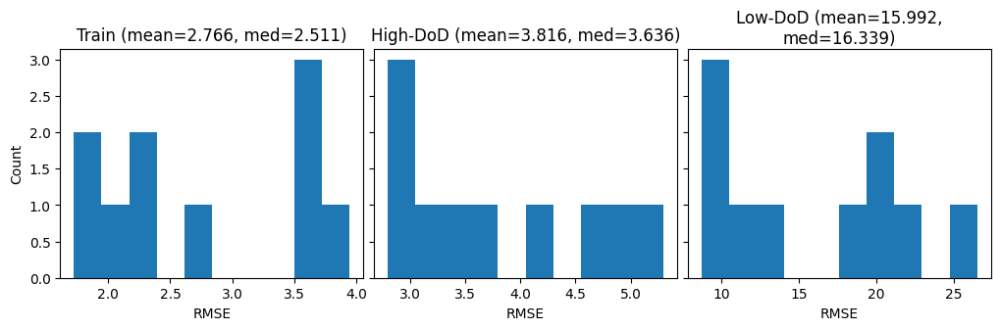

In [54]:
# Evaluate the result
fig,ax = plt.subplots(1,3,sharey=True,figsize=(10,3))
ax[0].hist(MAE_training)
ax[0].set_title(r"Train (mean={:.3f}, med={:.3f})".format(np.mean(MAE_training),np.median(MAE_training)),wrap=True)
ax[0].set_xlabel('RMSE')
ax[0].set_ylabel('Count')

ax[1].hist(MAE_test_in)
ax[1].set_title(r"High-DoD (mean={:.3f}, med={:.3f})".format(np.mean(MAE_test_in),np.median(MAE_test_in)),wrap=True)
ax[1].set_xlabel('RMSE')

ax[2].hist(MAE_test_out)
ax[2].set_title(r"Low-DoD (mean={:.3f}, med={:.3f})".format(np.mean(MAE_test_out),np.median(MAE_test_out)),wrap=True)
ax[2].set_xlabel('RMSE')
plt.tight_layout(pad=0.01)

## Visualize the prediction

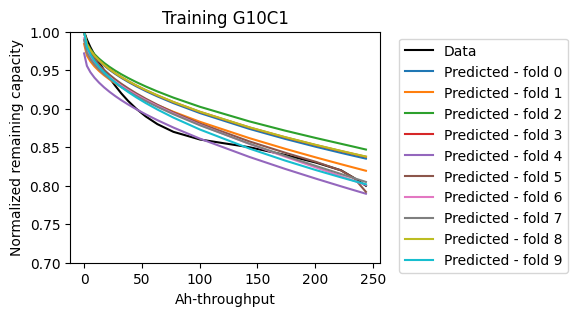

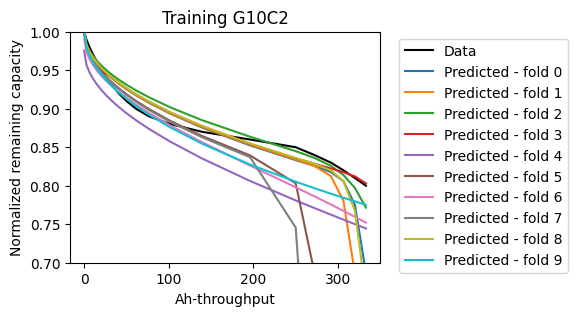

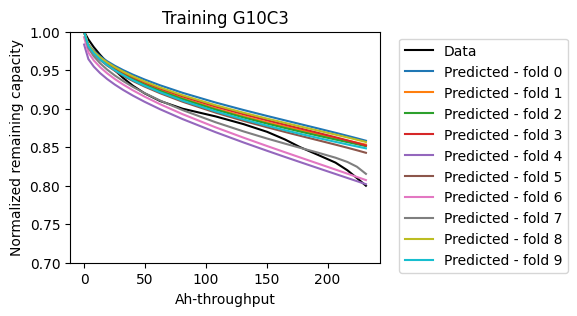

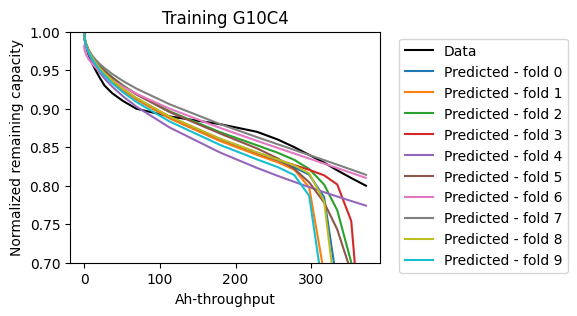

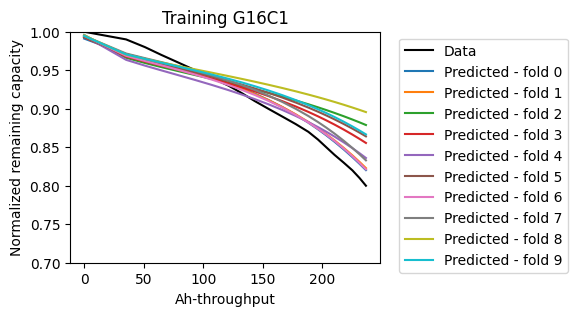

...

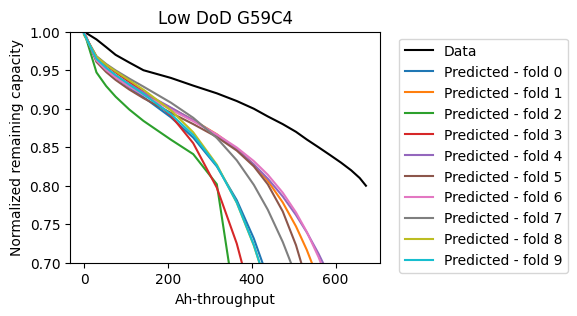

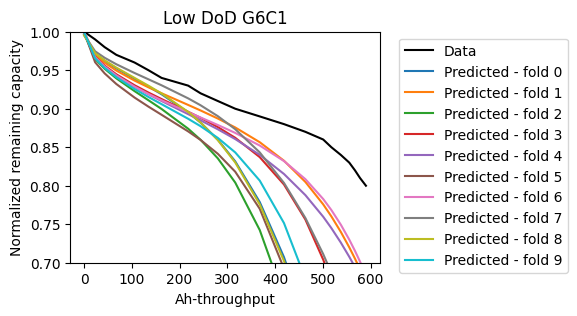

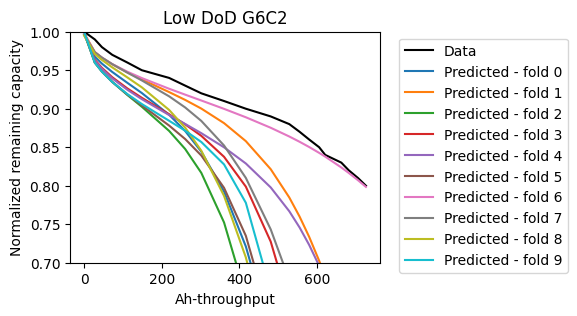

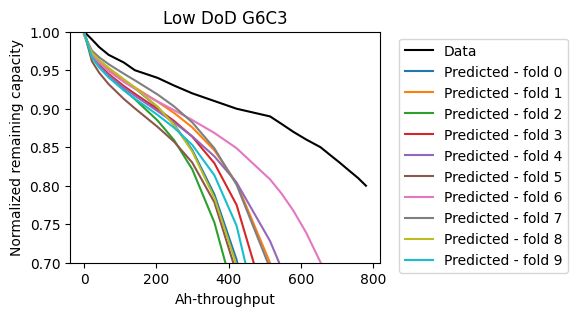

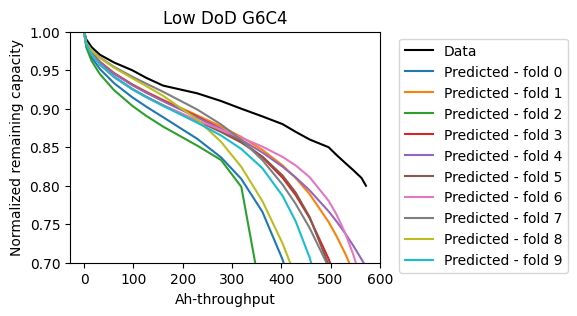

In [50]:
for iii,cell in enumerate(training_cells):
    plt.figure(figsize=(4,3))
    plt.plot(N_train[iii],Q_train[iii],'k',label="Data")
    for fold in range(10):
        plt.plot(N_train[iii],Q_train_pred[fold][iii],label = 'Predicted - fold {}'.format(fold))

    plt.xlabel('Ah-throughput')
    plt.ylabel('Normalized remaining capacity')
    # plt.title(r"Training {} RMSE={:.3f}".format(cell,train_RMSE[-1]))
    plt.title(r"Training {}".format(cell))
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.ylim(0.7,1)
    plt.show()

for iii,cell in enumerate(test_in_cells):
    plt.figure(figsize=(4,3))
    plt.plot(N_test_in[iii],Q_test_in[iii],'k',label="Data")
    for fold in range(10):
        plt.plot(N_test_in[iii],Q_test_in_pred[fold][iii],label = 'Predicted - fold {}'.format(fold))
    plt.xlabel('Ah-throughput')
    plt.ylabel('Normalized remaining capacity')
    # plt.title(r"High DoD {} RMSE={:.3f}".format(cell,test_in_RMSE[-1]))
    plt.title(r"High DoD {}".format(cell))
    plt.ylim(0.7,1)
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.show()

for iii,cell in enumerate(test_out_cells):
    plt.figure(figsize=(4,3))
    plt.plot(N_test_out[iii],Q_test_out[iii],'k',label="Data")
    for fold in range(10):
        plt.plot(N_test_out[iii],Q_test_out_pred[fold][iii],label = 'Predicted - fold {}'.format(fold))
    plt.xlabel('Ah-throughput')
    plt.ylabel('Normalized remaining capacity')
    # plt.title(r"Low DoD {} RMSE={:.3f}".format(cell,test_out_RMSE[-1]))
    plt.title(r"Low DoD {}".format(cell))
    plt.ylim(0.7,1)
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.show()